### **YOLOv8 by Steven Indriano**
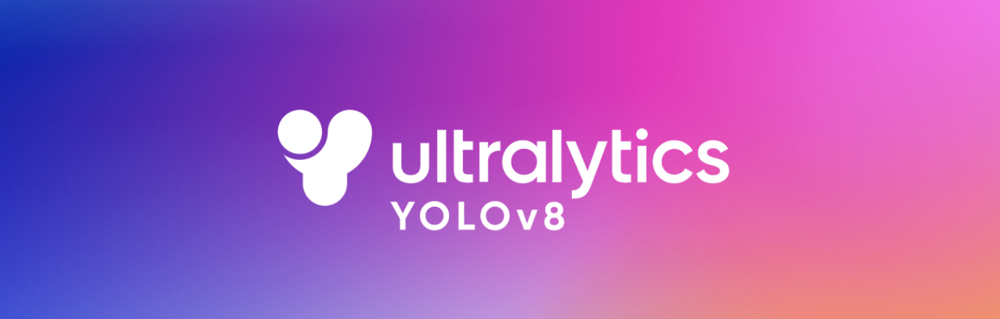

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.8/750.8 kB 4.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [3]:
import ultralytics
from ultralytics import YOLO
import cv2
from matplotlib import pyplot as plt
import urllib.request
import numpy as np


In [4]:
def load_model(model_name='yolov8n'):
    """Load the specified YOLOv8 model."""
    model = YOLO(model_name)
    return model

def download_image(image_url, image_path):
    """Download an image from the specified URL and save it to the given path."""
    urllib.request.urlretrieve(image_url, image_path)
    return image_path

def load_image(image_path):
    """Load an image from the specified path."""
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image_rgb

def perform_inference(model, image_rgb):
    """Perform inference using the YOLOv8 model on the provided RGB image."""
    results = model(image_rgb)
    return results

def visualize_results(results):
    """Visualize the results and count the number of persons detected."""
    person_count = 0
    plot_image = None
    for result in results:
        for det in result.boxes:
            if det.cls == 0:
                person_count += 1
        plot_image = result.plot()

    plot_rgb = cv2.cvtColor(plot_image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 10))
    plt.imshow(plot_rgb)
    plt.title(f'Detected Persons: {person_count}')
    plt.axis('off')
    plt.show()

    return person_count


100%|██████████| 6.23M/6.23M [00:00<00:00, 81.0MB/s]



0: 480x640 28 persons, 6 ties, 386.8ms
Speed: 18.0ms preprocess, 386.8ms inference, 3285.0ms postprocess per image at shape (1, 3, 480, 640)


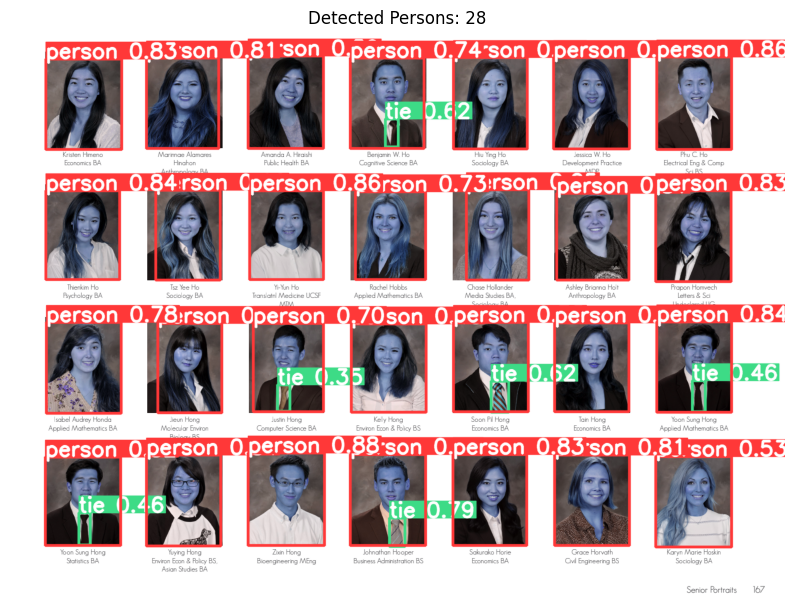

Number of people detected in the image: 28


In [5]:
def main():
    model = load_model('yolov8n')

    image_url = 'https://www.ocf.berkeley.edu/~bluegold/static/img/portraits_icons/portraits.png'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    results = perform_inference(model, image_rgb)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()


# **Using YOLOv8m**

In [6]:
def perform_inference(model, image_rgb, conf=0.5, iou=0.5):
    """Perform inference using the YOLOv8 model on the provided RGB image.

    Args:
        model: The YOLOv8 model.
        image_rgb: The RGB image.
        conf: Confidence threshold for detections.
        iou: Intersection over Union threshold for non-maximum suppression.

    Returns:
        Results from the model inference.
    """

    results = model(image_rgb, conf=conf, iou=iou)
    return results


100%|██████████| 49.7M/49.7M [00:00<00:00, 192MB/s]



0: 416x640 11 persons, 1714.7ms
Speed: 3.6ms preprocess, 1714.7ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)


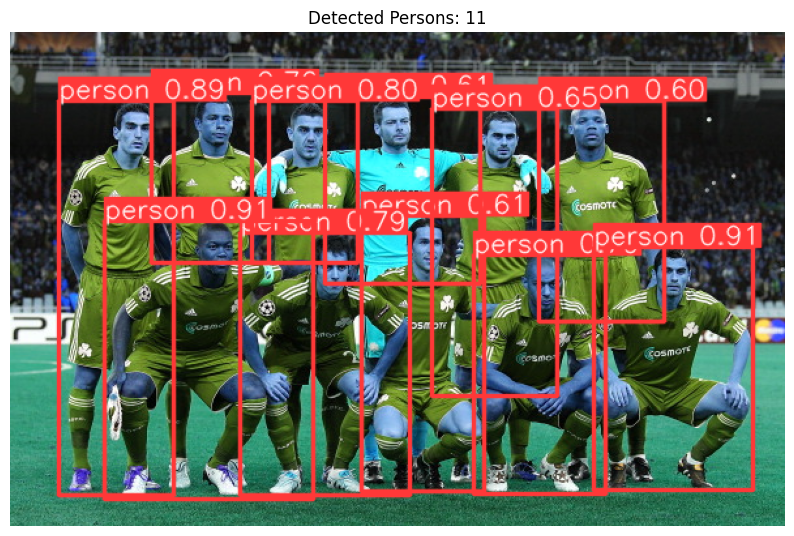

Number of people detected in the image: 11


In [7]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://cdn.bleacherreport.net/images_root/slides/photos/000/852/862/107111019_original.jpg?1302567411'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)


    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 448x640 7 persons, 1165.4ms
Speed: 5.9ms preprocess, 1165.4ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


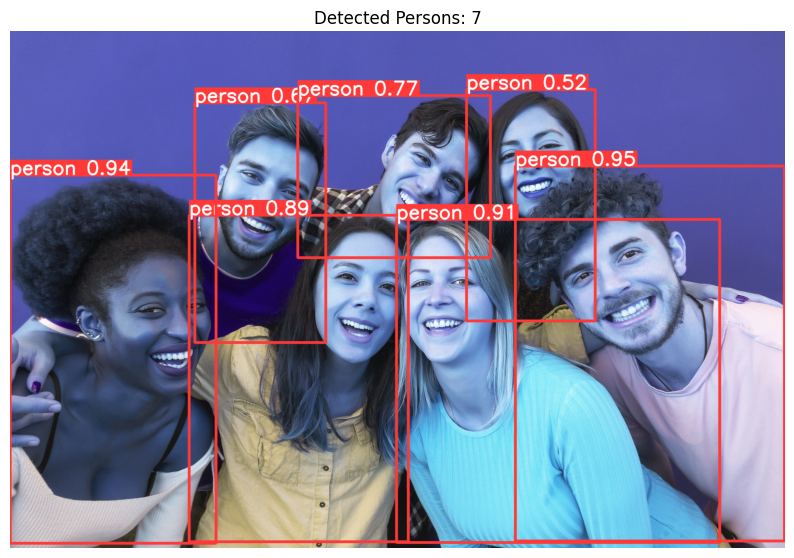

Number of people detected in the image: 7


In [8]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://www.lukkap.com/wp-content/uploads/2023/08/sistemas-de-voz.jpeg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)


    conf_threshold = 0.5
    iou_threshold = 0.5


    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 384x640 1 person, 2 bears, 988.2ms
Speed: 4.5ms preprocess, 988.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


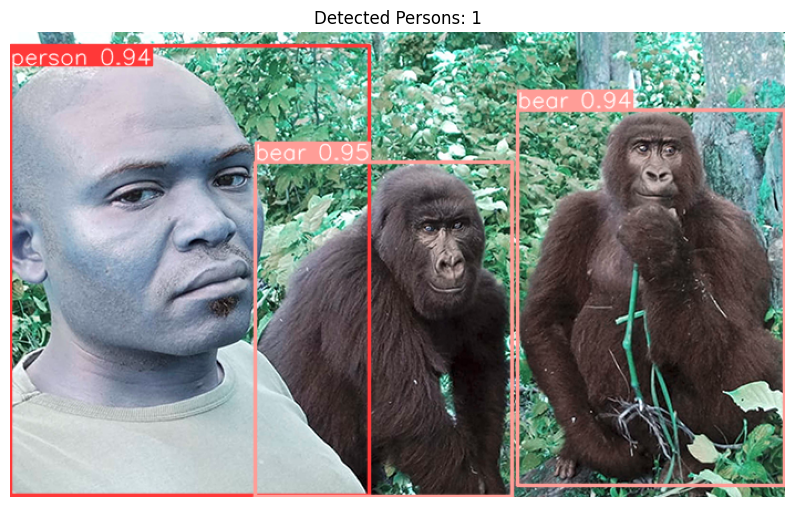

Number of people detected in the image: 1


In [9]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://img.theepochtimes.com/assets/uploads/2020/06/03/ET-GORILLA5784443620-700x420.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()


Somehow it detects gorilla as a bear?? hmm


0: 640x448 1 person, 1 horse, 1289.6ms
Speed: 6.2ms preprocess, 1289.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 448)


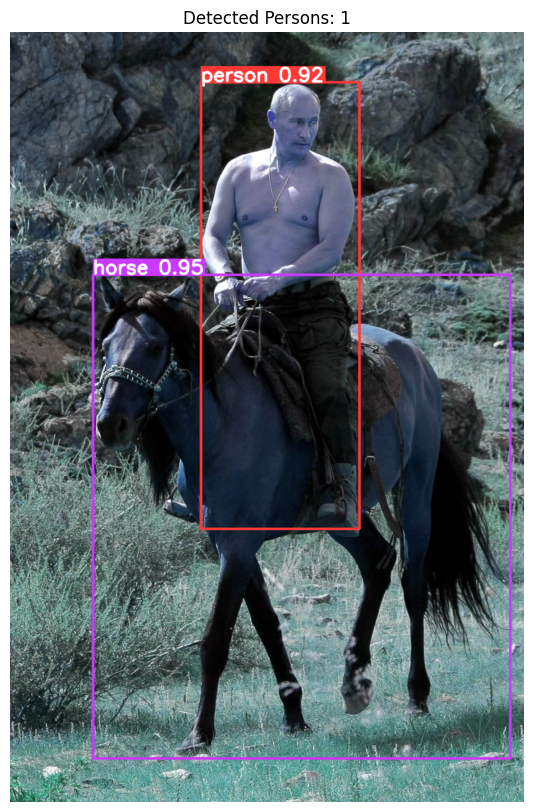

Number of people detected in the image: 1


In [10]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://s.abcnews.com/images/International/gty-putin-horse-er-170510_2x3_1600.jpg?w=1600'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 352x640 1 bus, 943.1ms
Speed: 5.4ms preprocess, 943.1ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)


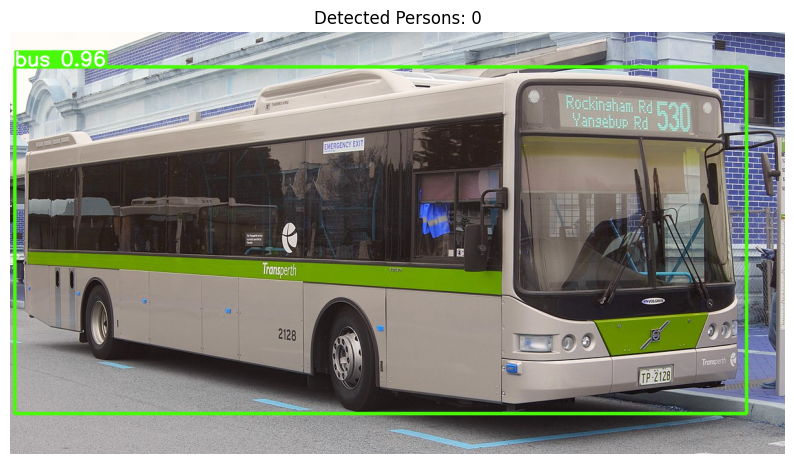

Number of people detected in the image: 0


In [11]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/a/a2/Transperth_Volgren_CR228L_bodied_Volvo_B7RLE.jpg/1200px-Transperth_Volgren_CR228L_bodied_Volvo_B7RLE.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 384x640 6 cars, 987.8ms
Speed: 4.7ms preprocess, 987.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


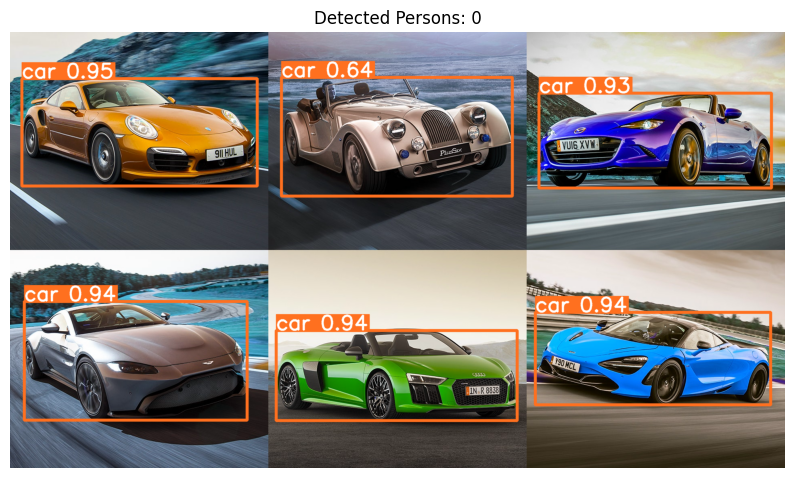

Number of people detected in the image: 0


In [12]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://media.gq-magazine.co.uk/photos/5e29911eef785000088173ee/master/pass/20200123-Sports-Cars-09.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 608x640 1 person, 1786.1ms
Speed: 3.9ms preprocess, 1786.1ms inference, 1.5ms postprocess per image at shape (1, 3, 608, 640)


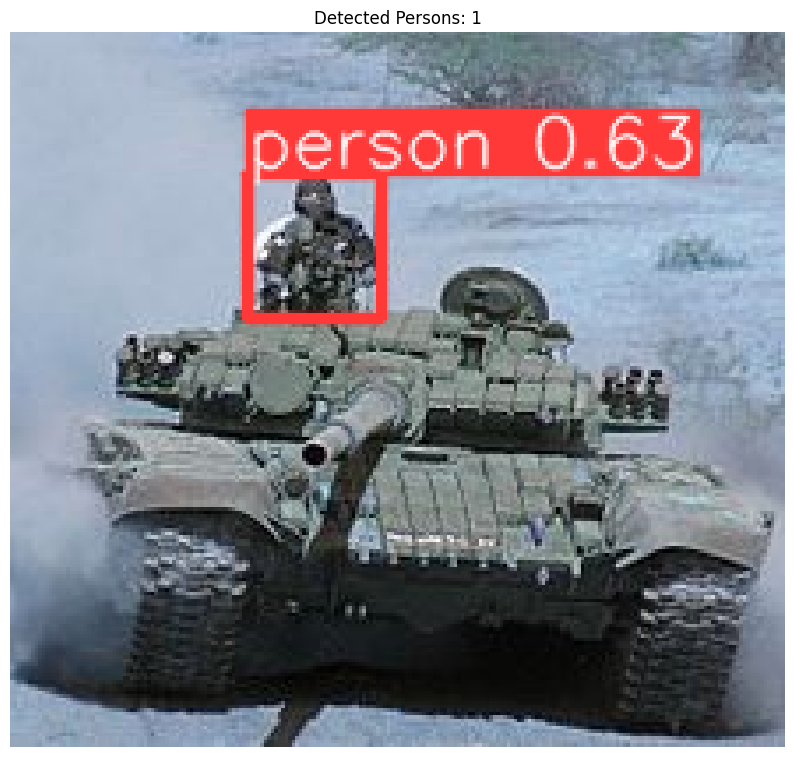

Number of people detected in the image: 1


In [13]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/f/fa/T-72_Ajeya1.jpg/220px-T-72_Ajeya1.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 352x640 3 persons, 2 cars, 1 motorcycle, 930.1ms
Speed: 5.2ms preprocess, 930.1ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)


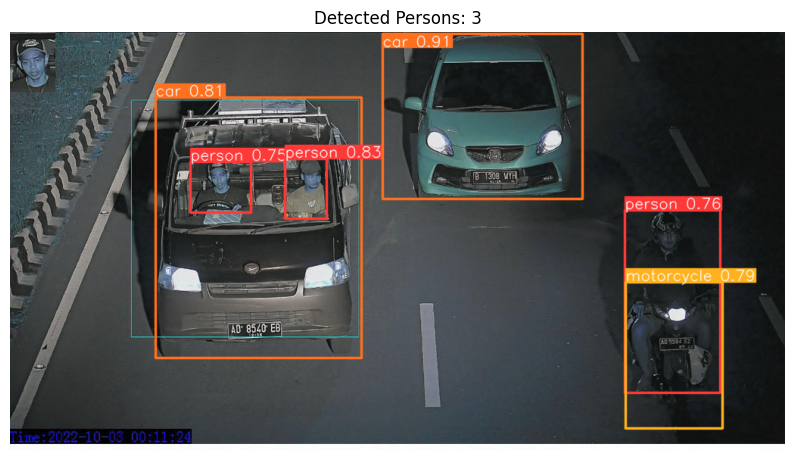

Number of people detected in the image: 3


In [14]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://www.inspirasiline.com/wp-content/uploads/2022/10/tidak-memakai-sabuk-pengaman.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 448x640 1 person, 1 car, 1110.4ms
Speed: 4.5ms preprocess, 1110.4ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


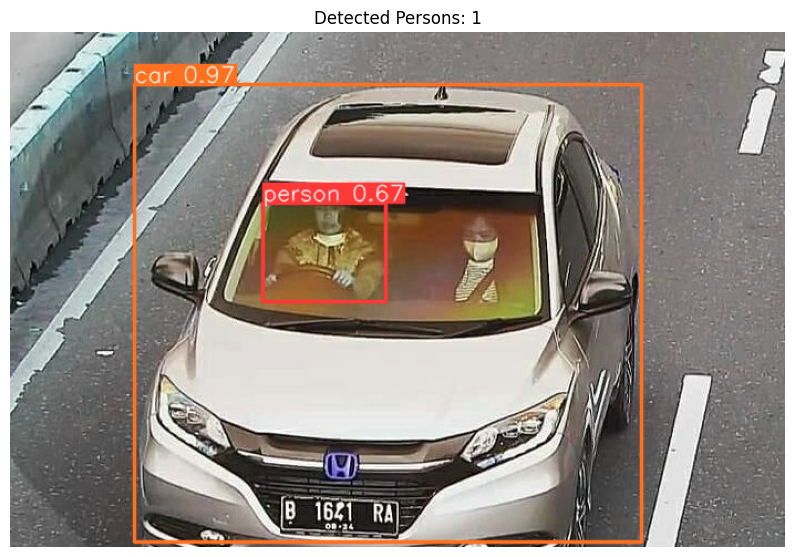

Number of people detected in the image: 1


In [15]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://imgx.gridoto.com/crop/0x0:0x0/700x465/photo/2021/01/08/1258576482.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()


Doesn't work on a person who wears mask


0: 448x640 3 persons, 1120.4ms
Speed: 4.6ms preprocess, 1120.4ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


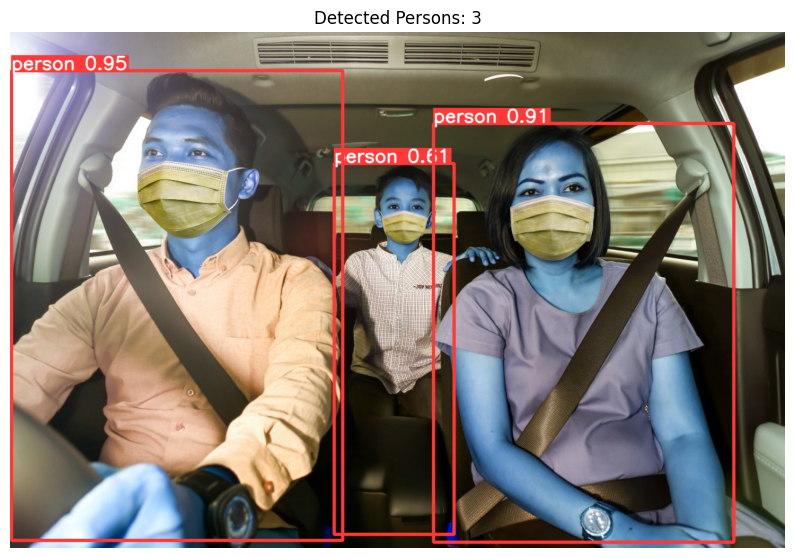

Number of people detected in the image: 3


In [16]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://hantaran.co/wp-content/uploads/2020/10/pengendara-mobil.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 640x480 1 person, 1211.7ms
Speed: 6.5ms preprocess, 1211.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


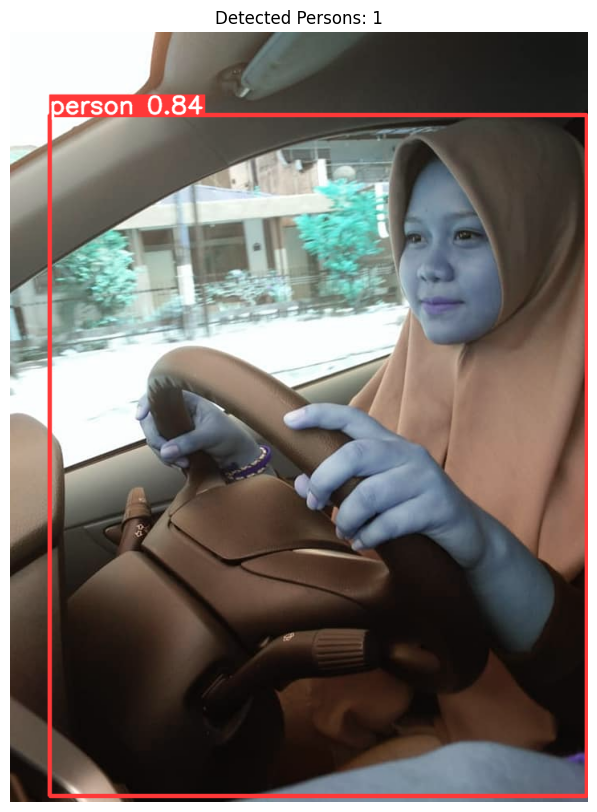

Number of people detected in the image: 1


In [17]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://scontent-cgk1-2.xx.fbcdn.net/v/t1.6435-9/106499612_912295805938016_3965479555057181490_n.jpg?_nc_cat=105&ccb=1-7&_nc_sid=5f2048&_nc_ohc=yhMUQ6l0nuEAb7jeLkS&_nc_ht=scontent-cgk1-2.xx&oh=00_AfBj5GKJ3PiCfMqJzzOixsLpT3JNeZ_e9-l4YqcmEiolxA&oe=664596A5'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 640x480 1 person, 1262.4ms
Speed: 6.1ms preprocess, 1262.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


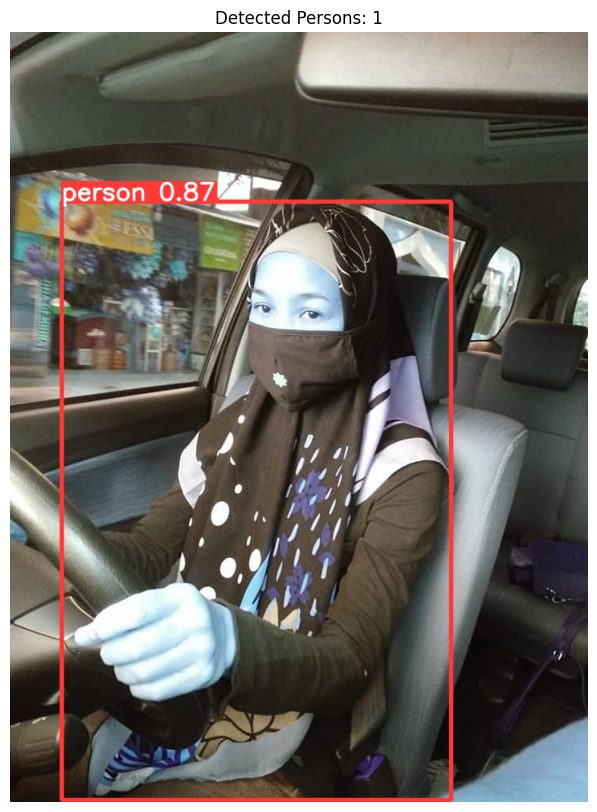

Number of people detected in the image: 1


In [18]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://scontent-cgk1-2.xx.fbcdn.net/v/t1.6435-9/78250763_912295632604700_8473819145037906527_n.jpg?_nc_cat=109&ccb=1-7&_nc_sid=5f2048&_nc_ohc=dCaRP-mpToUAb6zXZ2Z&_nc_ht=scontent-cgk1-2.xx&oh=00_AfCwHYBBTpKFs0wu38L52n25oDewNn86Sz0GBtzvnVBAkA&oe=66459A65'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 384x640 1 person, 1 chair, 974.2ms
Speed: 3.1ms preprocess, 974.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


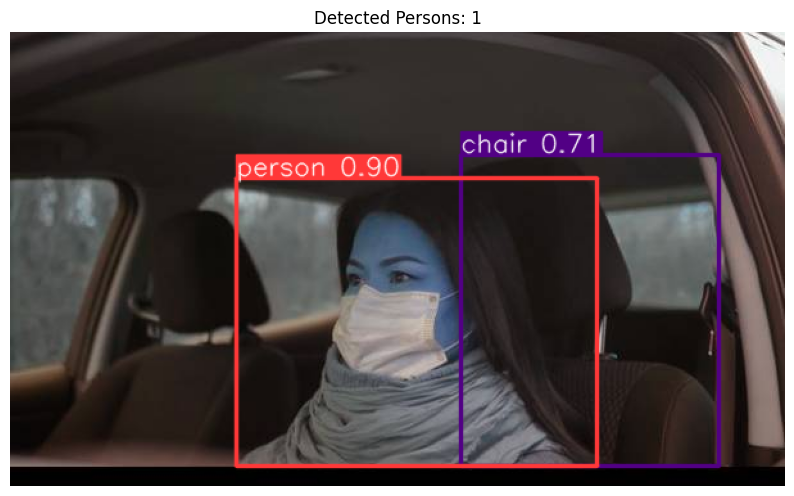

Number of people detected in the image: 1


In [19]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://media.kompas.tv/library/image/content_article/article_img/20200917090651.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 448x640 1 person, 1525.7ms
Speed: 5.4ms preprocess, 1525.7ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


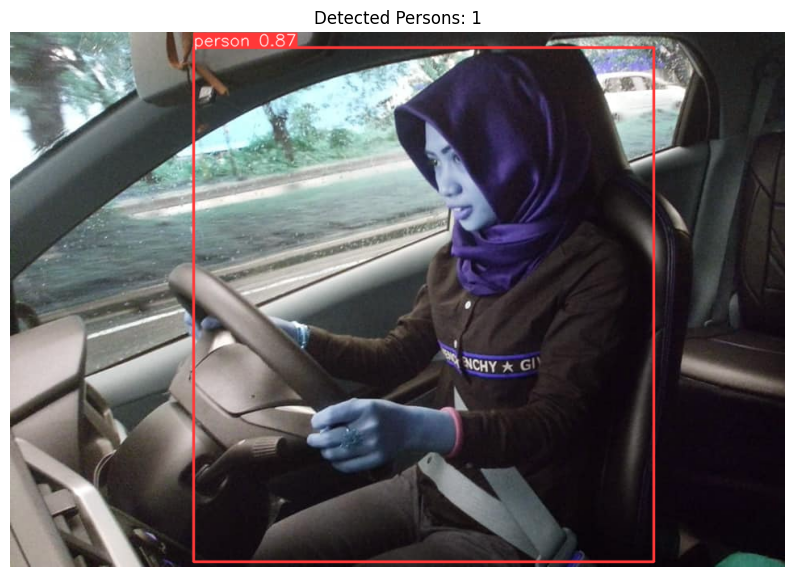

Number of people detected in the image: 1


In [20]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://scontent-cgk1-2.xx.fbcdn.net/v/t1.6435-9/106729047_912295745938022_6327782745429973842_n.jpg?_nc_cat=109&ccb=1-7&_nc_sid=5f2048&_nc_ohc=NcPKBj-GWDMAb7vX1J-&_nc_ht=scontent-cgk1-2.xx&oh=00_AfDN-HG7kBoKCRqhnk6OxffXr5DYkEqzAF1dqGL_KRvAYQ&oe=664591D5'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 384x640 2 persons, 933.9ms
Speed: 4.6ms preprocess, 933.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


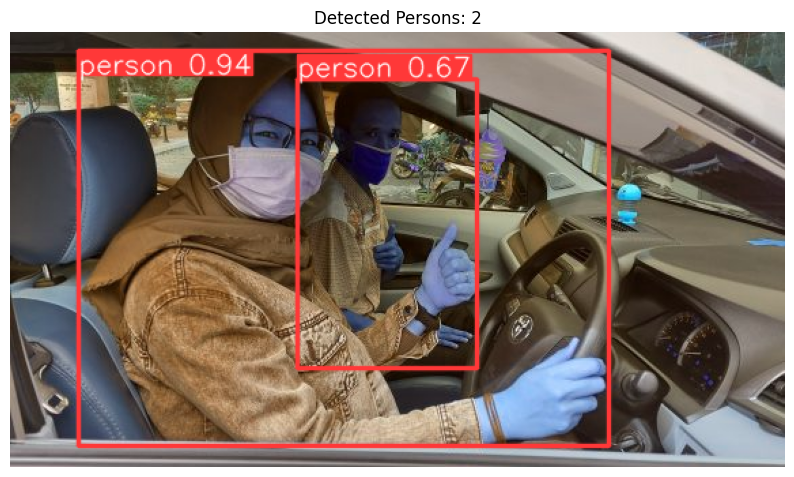

Number of people detected in the image: 2


In [21]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://satriajayanti.co.id/wp-content/uploads/2020/07/20200619_095006-570x320.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 640x480 1 person, 1204.5ms
Speed: 5.0ms preprocess, 1204.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 480)


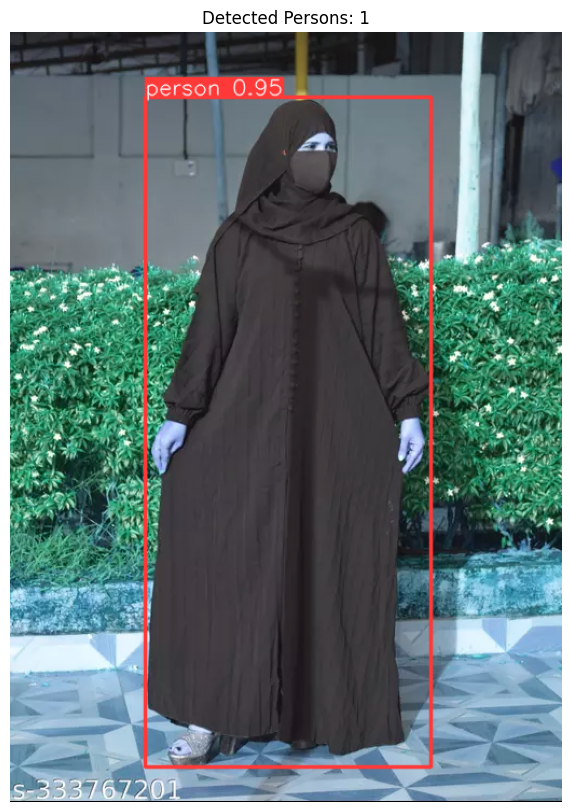

Number of people detected in the image: 1


In [22]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://images.meesho.com/images/products/333767201/zevjc_512.webp'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 640x480 1 person, 1865.5ms
Speed: 3.7ms preprocess, 1865.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


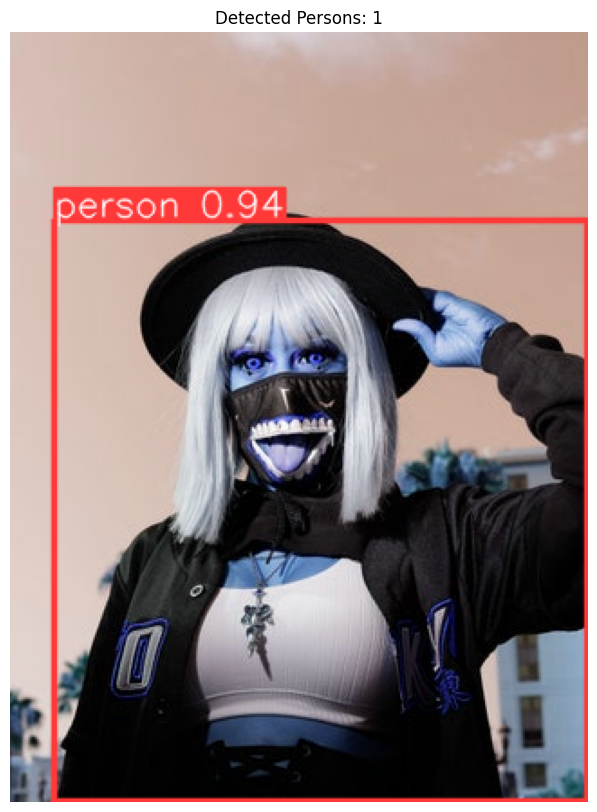

Number of people detected in the image: 1


In [23]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://media.wired.com/photos/62e1bc97d7368105da057d7f/master/w_320%2Cc_limit/Goncalves-3313-Comic-Con-2022%2520-Culture.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 640x640 1 person, 1653.4ms
Speed: 5.4ms preprocess, 1653.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


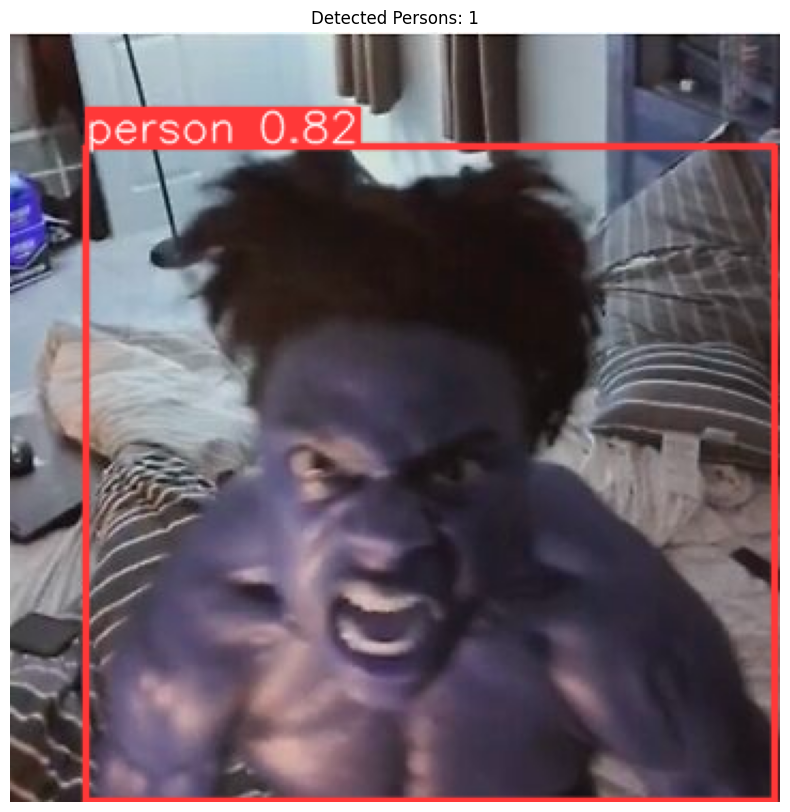

Number of people detected in the image: 1


In [24]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://ih0.redbubble.net/image.3295242309.1693/raf,360x360,075,t,fafafa:ca443f4786.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 640x512 1 person, 1 umbrella, 1324.9ms
Speed: 6.2ms preprocess, 1324.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 512)


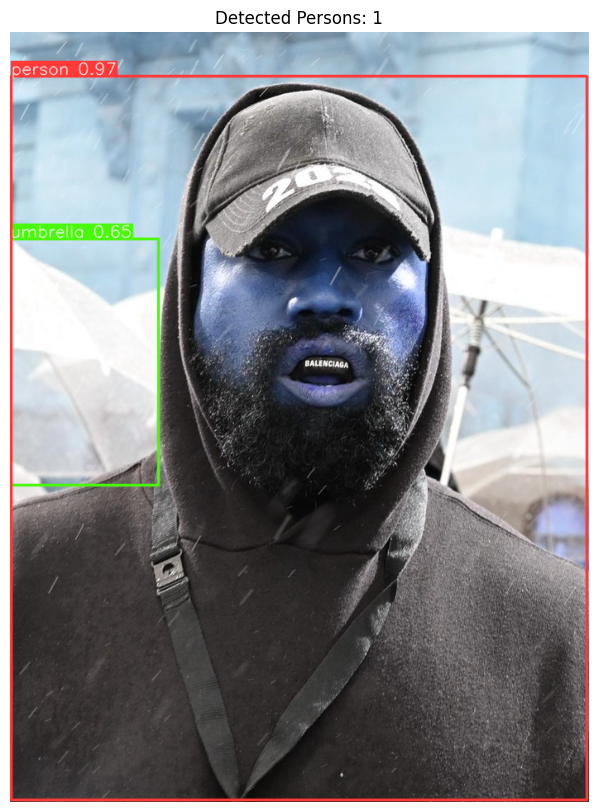

Number of people detected in the image: 1


In [25]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://awsimages.detik.net.id/community/media/visual/2022/10/22/kanye-west-dan-balenciaga-1_34.jpeg?w=700&q=90'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 640x544 1 person, 1427.9ms
Speed: 5.9ms preprocess, 1427.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 544)


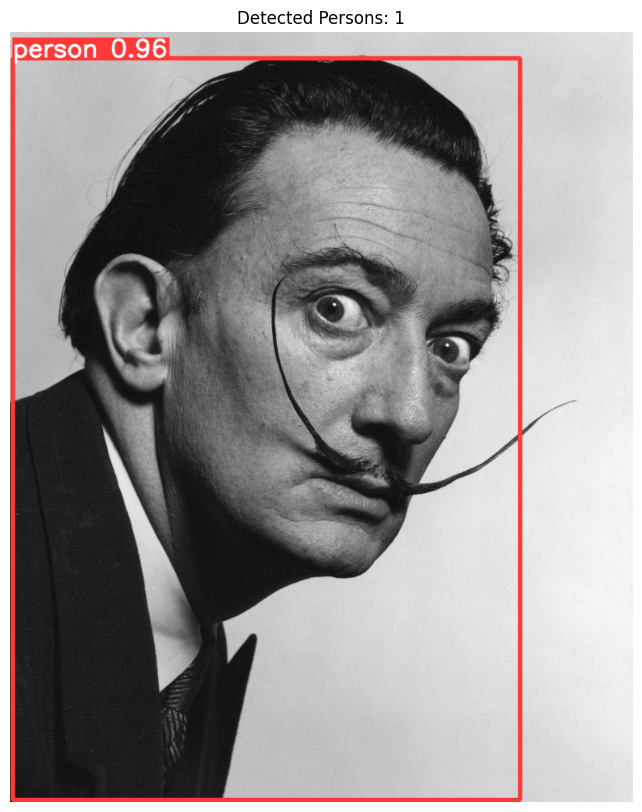

Number of people detected in the image: 1


In [26]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://assets-a1.kompasiana.com/items/album/2017/07/21/dali-597159d24fc4aa25a3640862.jpg?t=o&v=770'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5


    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()



0: 384x640 1 person, 980.6ms
Speed: 5.3ms preprocess, 980.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


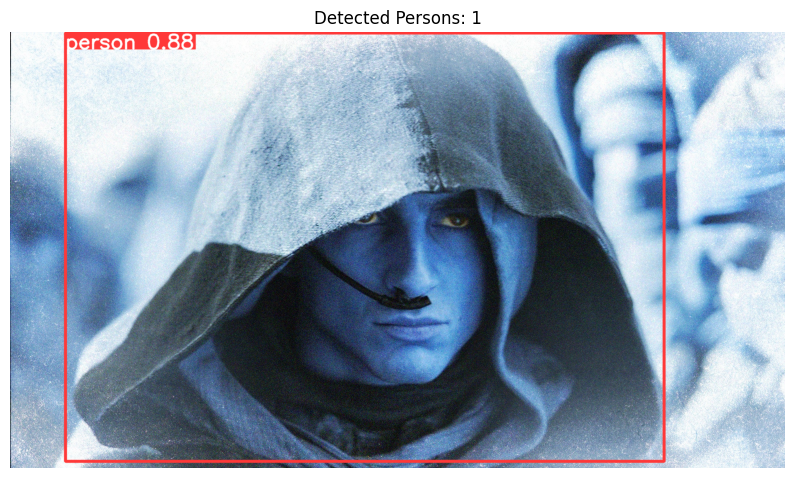

Number of people detected in the image: 1


In [27]:
def main():

    model = load_model('yolov8m')

    image_url = 'https://media.gqitalia.it/photos/65d4689834d744a8a641c65f/16:9/w_2560%2Cc_limit/dune2.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()


### **YOLOv8x (Most Accurate but the Slowest)**

100%|██████████| 131M/131M [00:00<00:00, 188MB/s]



0: 448x640 6 persons, 3198.2ms
Speed: 4.1ms preprocess, 3198.2ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


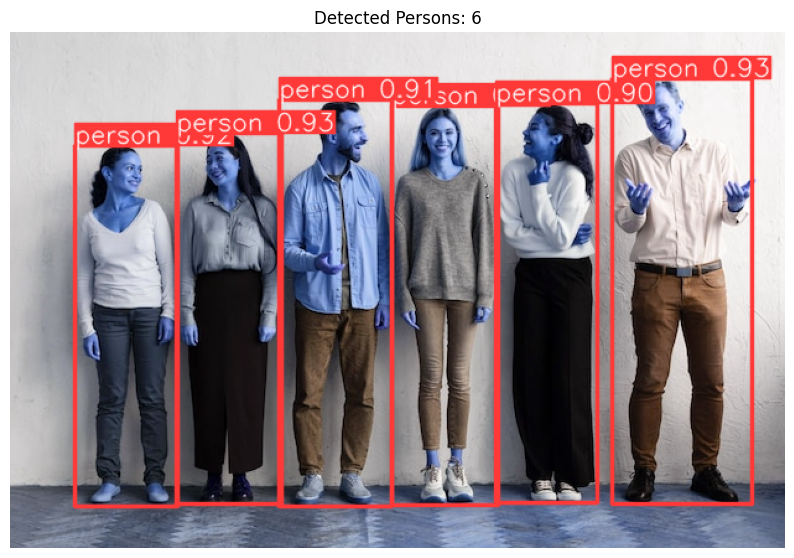

Number of people detected in the image: 6


In [28]:
def main():

    model = load_model('yolov8x')

    image_url = 'https://img.freepik.com/free-photo/front-view-smiley-people-group-therapy-session_23-2148752041.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()


0: 480x640 28 persons, 5 ties, 4338.0ms
Speed: 5.6ms preprocess, 4338.0ms inference, 5.3ms postprocess per image at shape (1, 3, 480, 640)


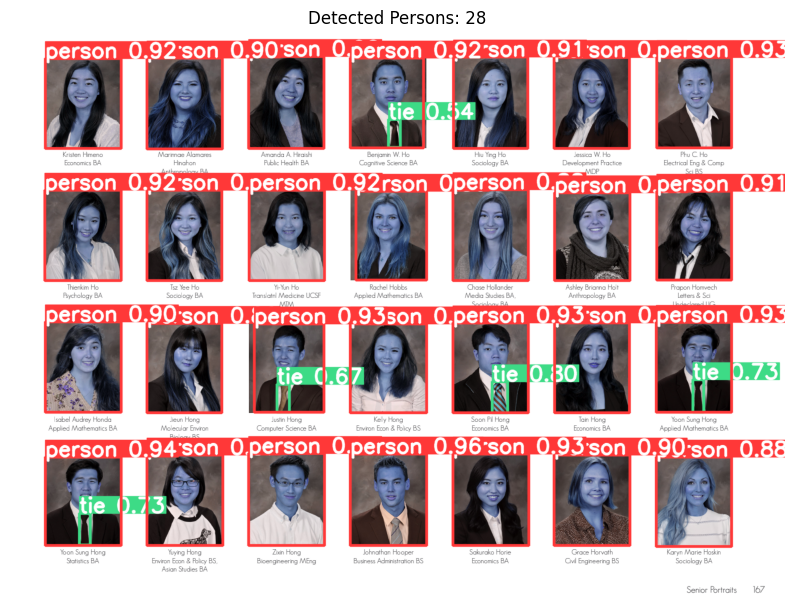

Number of people detected in the image: 28


In [29]:
def main():

    model = load_model('yolov8x')

    image_url = 'https://www.ocf.berkeley.edu/~bluegold/static/img/portraits_icons/portraits.png'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()


0: 384x640 5 persons, 2894.8ms
Speed: 6.2ms preprocess, 2894.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


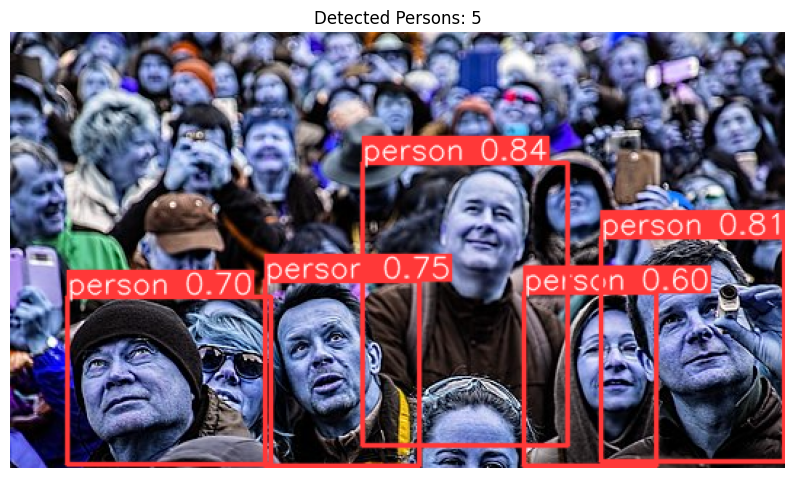

Number of people detected in the image: 5


In [30]:
def main():

    model = load_model('yolov8x')

    image_url = 'https://www.security-ligue.org/fileadmin/_processed_/c/c/csm_crowd_9a2fce0777.jpg'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()


0: 384x640 7 persons, 2 cars, 1 motorcycle, 2843.9ms
Speed: 3.9ms preprocess, 2843.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


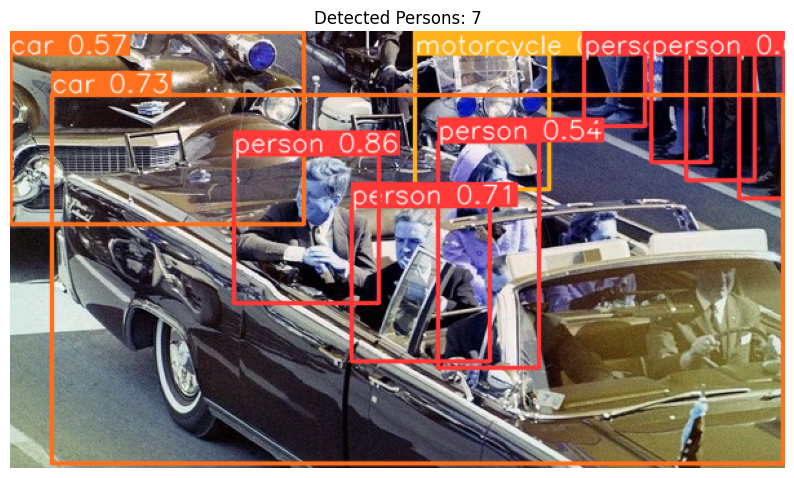

Number of people detected in the image: 7


In [31]:
def main():

    model = load_model('yolov8x')

    image_url = 'https://awsimages.detik.net.id/community/media/visual/2023/10/09/misteri-abadi-yang-masih-meliputi-pembunuhan-jfk.jpeg?w=600&q=90'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()


0: 448x640 (no detections), 4006.8ms
Speed: 6.0ms preprocess, 4006.8ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)


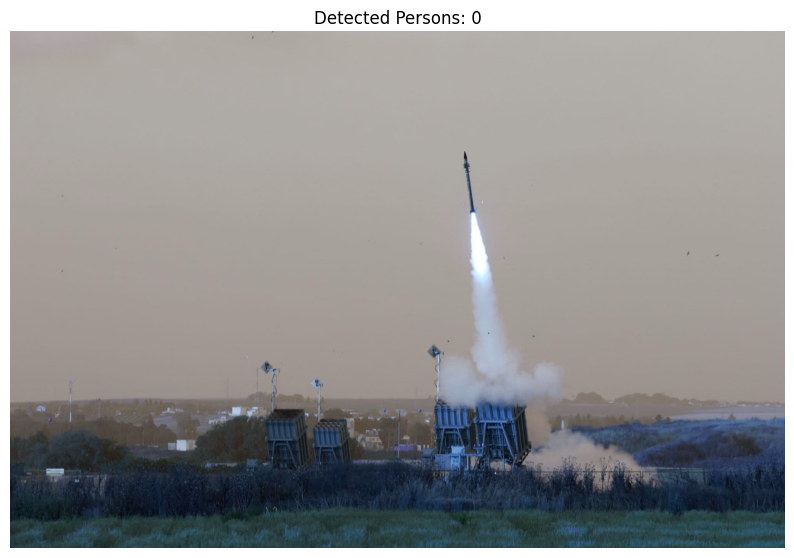

Number of people detected in the image: 0


In [32]:
def main():

    model = load_model('yolov8x')

    image_url = 'https://media.cnn.com/api/v1/images/stellar/prod/gettyimages-1254495486.jpg?c=original'
    image_path = 'test_image.jpg'

    download_image(image_url, image_path)
    image_rgb = load_image(image_path)

    conf_threshold = 0.5
    iou_threshold = 0.5

    results = perform_inference(model, image_rgb, conf=conf_threshold, iou=iou_threshold)

    person_count = visualize_results(results)
    print(f'Number of people detected in the image: {person_count}')

if __name__ == '__main__':
    main()